In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
from matplotlib.gridspec import GridSpecFromSubplotSpec

import networkx as nx

import os
import os.path as op

import importlib

import dgsp
import graph_examples as dgsp_graphs
import plotting as dgsp_plot

import bimod_plots as plot

In [3]:
path_to_figures = "./figures/01-BiMod"

os.makedirs(path_to_figures, exist_ok=True)

inch_to_cm = 2.54
cm_to_inch = 1/inch_to_cm

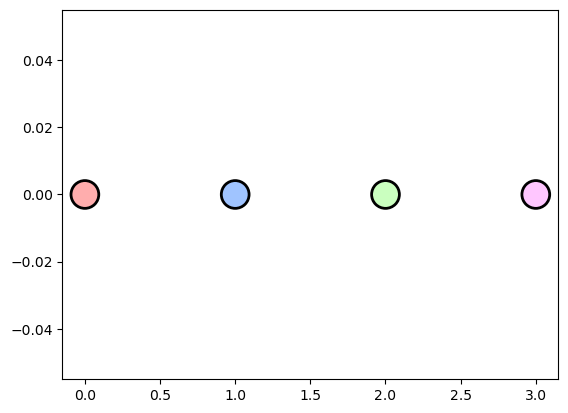

In [4]:
plot.plot_palette()

# Toy scheme and plot (Figure 1)

R^2 = 0.12610556188545635


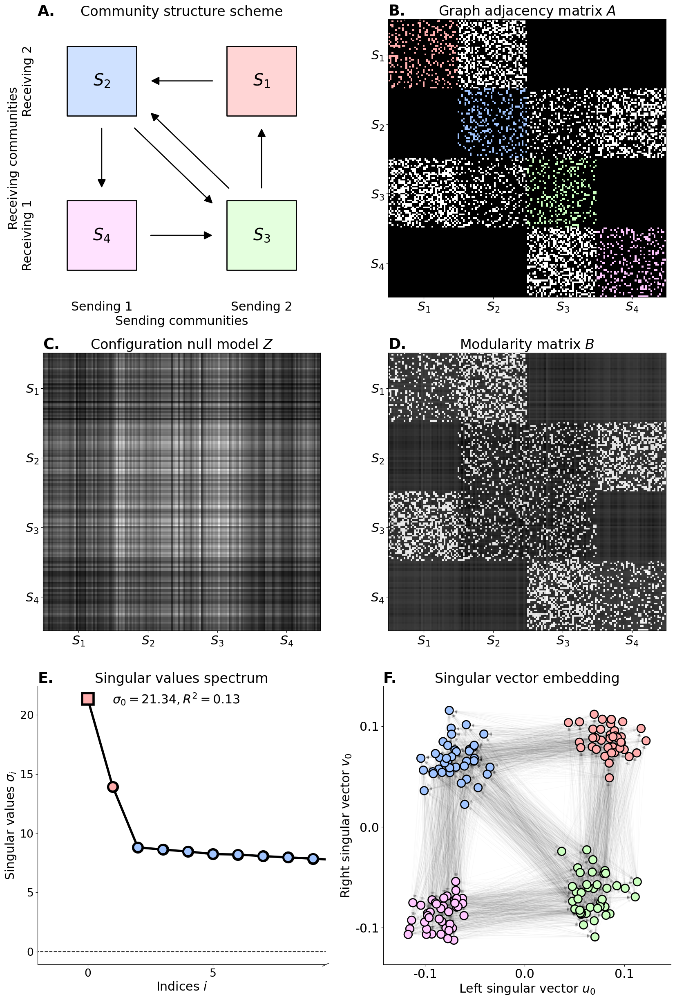

In [4]:
importlib.reload(plot)

n_per_com = 40
density_value = .4
eig_id = 0

write_s = True
for_overleaf = True

# Building the graph
graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1, 0, 0, 0.5, 1, 0], seed=1234)

fig, axes = plt.subplots(3, 2, figsize=(2*10, 3*10))

axes[0, 0] = plot.plot_community_scheme(ax=axes[0, 0], title_letter="A.")
axes[0, 1] = plot.plot_adjacency(graph, ax=axes[0, 1], title_letter="B.",
                                 override_title=r"Graph adjacency matrix ${A}$")

axes[1, 0] = plot.plot_adjacency(dgsp.configuration_null(graph, "outin"), ax=axes[1, 0], title_letter="C.",
                                 use_cmap=False, override_title=r"Configuration null model ${Z}$")
axes[1, 1] = plot.plot_adjacency(dgsp.modularity_matrix(graph, "outin"), ax=axes[1, 1], title_letter="D.",
                                 use_cmap=False, override_title=r"Modularity matrix ${B}$")

axes[2, 0] = plot.plot_spectrum(graph, vector_id=eig_id, write_s=write_s, fig=fig, ax=axes[2, 0], fix_negative=False,
                                title_letter="E.", override_title="Singular values spectrum")
axes[2, 1] = plot.plot_graph_embedding(graph, vector_id=eig_id, ax=axes[2, 1], title_letter="F.")

dpi = 600
overleaf_suffix = ""
fname = f"Figure-01-eig{eig_id:02d}{write_s*'-writeS'}-v00{overleaf_suffix*for_overleaf}.png"
fig.savefig(op.join(path_to_figures, fname),
            dpi=dpi, bbox_inches="tight")

dpi = 100
overleaf_suffix = "-Overleaf"
fname = f"Figure-01-eig{eig_id:02d}{write_s*'-writeS'}-v00{overleaf_suffix*for_overleaf}.png"
fig.savefig(op.join(path_to_figures, fname), dpi=dpi, bbox_inches="tight")

# *C. Elegans* example (Figure 2)

# Comparisons with symmetric verions

# Supplementaries
## Less ideal synthetic model (`SI-Synth-LessIdeal`)

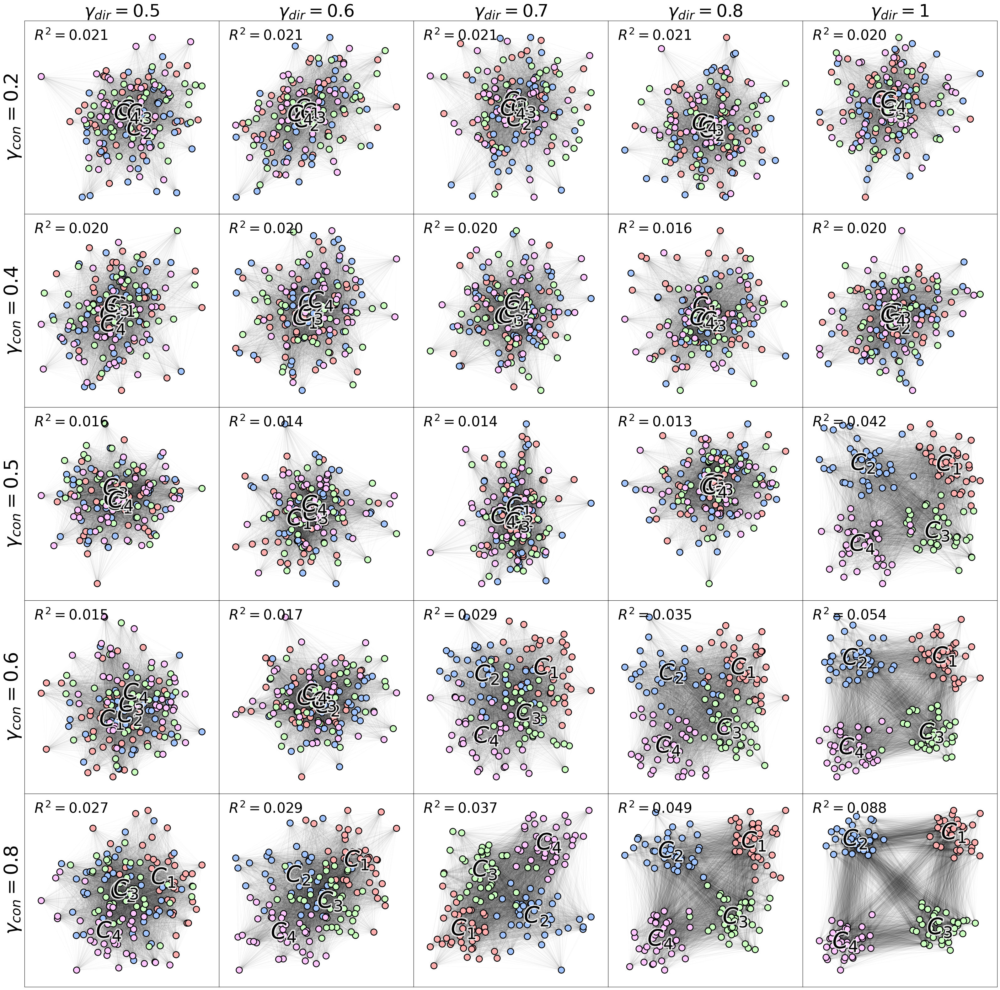

In [138]:
importlib.reload(plot)

n_per_com = 40
rand_density = 0

con_densities = [0.2, 0.4, 0.5, 0.6, 0.8]
dir_densities = [0.5, 0.6, 0.7, 0.8, 1]

eig_id = 0
fontscale = 2

write_s = True
for_overleaf = True

fig, axes = plt.subplots(len(con_densities), len(dir_densities),
                         gridspec_kw={"hspace": 0, "wspace": 0},
                         #gridspec_kw={"hspace": 0.08, "wspace": 0.08},
                         figsize=(len(con_densities)*8, len(dir_densities)*8))#,
                         #sharex=True, sharey=True)

for row_i, ax_row in enumerate(axes):
    for col_i, ax in enumerate(ax_row):
        # Building the graph
        graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=con_densities[row_i],
                                              connect_density=[con_densities[row_i], con_densities[row_i], 0, con_densities[row_i],
                                                               con_densities[row_i], con_densities[row_i]],
                                              connect_out_prob=[dir_densities[col_i], 1-dir_densities[col_i], 1-dir_densities[col_i],
                                                                0.5, dir_densities[col_i], 1-dir_densities[col_i]],
                                              seed=1234)
        
        graph += dgsp_graphs.random_graph(n_per_com*4, rand_density, seed=1234)
        graph = (graph > 0).astype(int)

        title = ""
        if row_i == 0:
            title += f"$\gamma_{{dir}}={dir_densities[col_i]}$"

        ax = plot.plot_graph_embedding(graph, vector_id=eig_id, write_label=True, write_var=True,
                                       ax=ax, directed_edges=False,
                                       override_title=title, fontscale=fontscale, label_lw=6)

        ax.spines[:].set_visible(True)

        ax.set_xlabel("")
        ax.set_ylabel("")
        
        if col_i == 0:
            ax.set_ylabel(f"$\gamma_{{con}}={con_densities[row_i]}$", fontsize=22*fontscale)

        ax.set_yticks([])
        ax.set_xticks([])

fig.savefig(op.join(path_to_figures, f"SI-Synth-LessIdeal-r{rand_density:1.1f}-Overleaf.png"), dpi=100, bbox_inches="tight")

# Assortiative to Dissortative and Undirected to Directed (`SI-Synth-AssortDissort`)

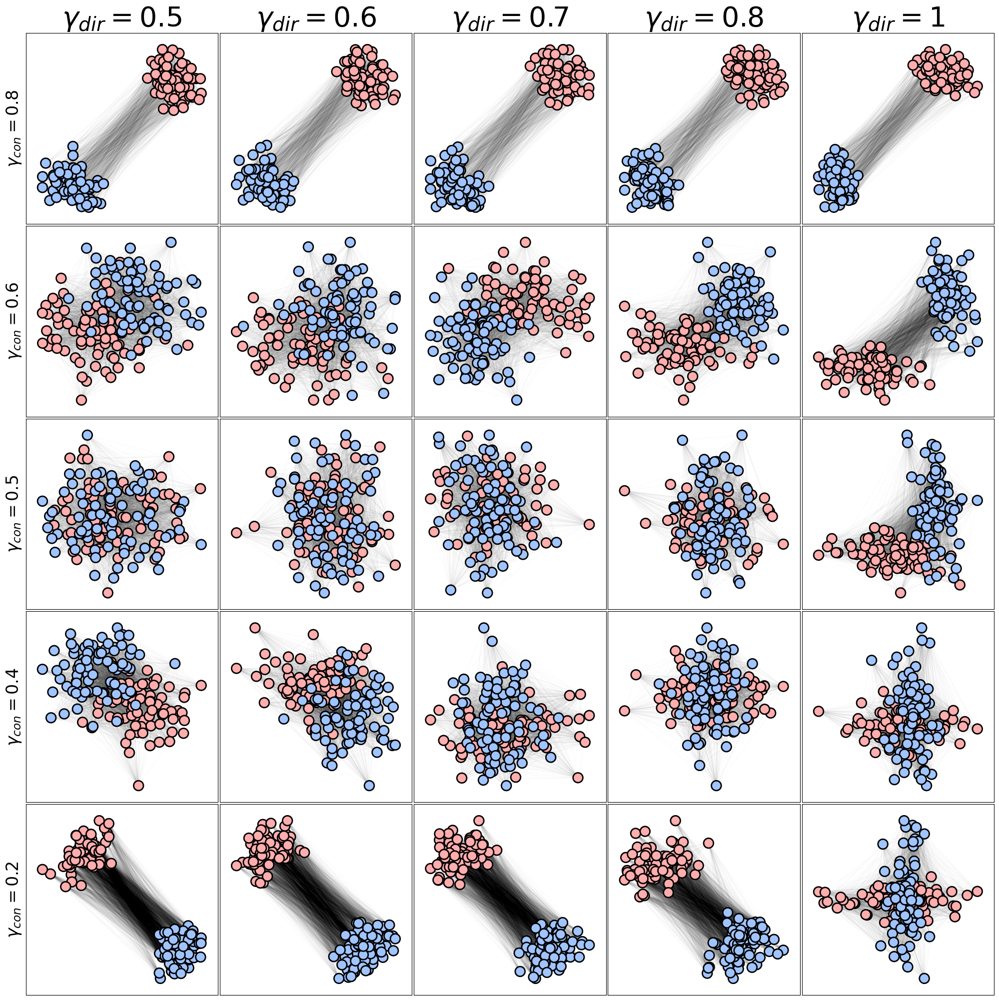

In [ ]:
importlib.reload(plot)

n_per_com = 40
rand_density = 0

base_density = 0.8
#con_densities = [0.2, 0.4, 0.5, 0.6, 0.8]
con_densities = [0.8, 0.6, 0.5, 0.4, 0.2]
dir_densities = [0.5, 0.6, 0.7, 0.8, 1]

vector_id = 0
fontscale = 2

write_s = True
for_overleaf = True

fig, axes = plt.subplots(len(con_densities), len(dir_densities),
                         gridspec_kw={"hspace": 0.01, "wspace": 0.01},
                         #gridspec_kw={"hspace": 0.08, "wspace": 0.08},
                         figsize=(len(con_densities)*5, len(dir_densities)*5))#,
                         #sharex=True, sharey=True)

for row_i, ax_row in enumerate(axes):
    for col_i, ax in enumerate(ax_row):
        # Building the graph
        graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=base_density*con_densities[row_i],
                                              connect_density=[base_density*con_densities[row_i],
                                                               base_density*(1-con_densities[row_i]),
                                                               base_density*(1-con_densities[row_i]),
                                                               base_density*(1-con_densities[row_i]),
                                                               base_density*(1-con_densities[row_i]),
                                                               base_density*con_densities[row_i]],
                                              connect_out_prob=[0.5,
                                                                dir_densities[col_i],
                                                                dir_densities[col_i],
                                                                dir_densities[col_i],
                                                                dir_densities[col_i],
                                                                0.5],
                                              seed=1234)

        title = ""
        if row_i == 0:
            title += f"$\gamma_{{dir}}={dir_densities[col_i]}$"

        ax = plot.plot_graph_embedding(graph, vector_id=eig_id, n_com=2,
                                       ax=ax, directed_edges=False,
                                       override_title=title, fontscale=fontscale, label_lw=6, fix_negative=False)
        #ax = plot.plot_adjacency(graph, ax=ax, title_letter="", use_cmap=False, override_title=title)
        #U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph), fix_negative=False)
        #ax.plot(S)

        ax.spines[:].set_visible(True)

        ax.set_xlabel("")
        ax.set_ylabel("")
        
        if col_i == 0:
            ax.set_ylabel(f"$\gamma_{{con}}={con_densities[row_i]}$", fontsize=12*fontscale)

        ax.set_yticks([])
        ax.set_xticks([])

fig.savefig(op.join(path_to_figures, f"SI-Synth-AssorDissor-Overleaf.png"), dpi=100, bbox_inches="tight")